In [19]:
import math
import os
import glob
from collections import defaultdict
from pathlib import Path

import cv2
import numpy as np
import mediapipe as mp
import matplotlib.pyplot as plt

In [20]:
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.3, model_complexity=1)
mp_drawing = mp.solutions.drawing_utils

In [21]:
def calculate_angle(a, b, c):
    """Return the 2D angle (in degrees) at point b formed by a-b-c using normalized x,y."""
    a = [a.x, a.y]
    b = [b.x, b.y]
    c = [c.x, c.y]

    ab = [a[0] - b[0], a[1] - b[1]]
    cb = [c[0] - b[0], c[1] - b[1]]

    dot = ab[0] * cb[0] + ab[1] * cb[1]
    mag_ab = math.sqrt(ab[0]**2 + ab[1]**2)
    mag_cb = math.sqrt(cb[0]**2 + cb[1]**2)

    if mag_ab == 0 or mag_cb == 0:
        return 0.0

    # Clamp for numerical safety
    cosang = max(-1.0, min(1.0, dot / (mag_ab * mag_cb)))
    angle = math.degrees(math.acos(cosang))
    return angle

def compute_joint_angles(lm, mp_pose_=mp_pose):
    """Compute all angles used by the rules and return as a dict."""
    angles = {}
    angles["Right Knee"] = calculate_angle(lm[mp_pose_.PoseLandmark.RIGHT_HIP],
                                           lm[mp_pose_.PoseLandmark.RIGHT_KNEE],
                                           lm[mp_pose_.PoseLandmark.RIGHT_ANKLE])

    angles["Left Knee"]  = calculate_angle(lm[mp_pose_.PoseLandmark.LEFT_HIP],
                                           lm[mp_pose_.PoseLandmark.LEFT_KNEE],
                                           lm[mp_pose_.PoseLandmark.LEFT_ANKLE])

    angles["Right Hip"]  = calculate_angle(lm[mp_pose_.PoseLandmark.RIGHT_SHOULDER],
                                           lm[mp_pose_.PoseLandmark.RIGHT_HIP],
                                           lm[mp_pose_.PoseLandmark.RIGHT_KNEE])

    angles["Left Hip"]   = calculate_angle(lm[mp_pose_.PoseLandmark.LEFT_SHOULDER],
                                           lm[mp_pose_.PoseLandmark.LEFT_HIP],
                                           lm[mp_pose_.PoseLandmark.LEFT_KNEE])

    angles["Right Elbow"]= calculate_angle(lm[mp_pose_.PoseLandmark.RIGHT_SHOULDER],
                                           lm[mp_pose_.PoseLandmark.RIGHT_ELBOW],
                                           lm[mp_pose_.PoseLandmark.RIGHT_WRIST])

    angles["Left Elbow"] = calculate_angle(lm[mp_pose_.PoseLandmark.LEFT_SHOULDER],
                                           lm[mp_pose_.PoseLandmark.LEFT_ELBOW],
                                           lm[mp_pose_.PoseLandmark.LEFT_WRIST])

    angles["Right Shoulder"] = calculate_angle(lm[mp_pose_.PoseLandmark.RIGHT_ELBOW],
                                               lm[mp_pose_.PoseLandmark.RIGHT_SHOULDER],
                                               lm[mp_pose_.PoseLandmark.RIGHT_HIP])

    angles["Left Shoulder"]  = calculate_angle(lm[mp_pose_.PoseLandmark.LEFT_ELBOW],
                                               lm[mp_pose_.PoseLandmark.LEFT_SHOULDER],
                                               lm[mp_pose_.PoseLandmark.LEFT_HIP])

    # ankles (heel-to-toe)
    angles["Right Ankle (Heel-to-Toe)"] = calculate_angle(lm[mp_pose_.PoseLandmark.RIGHT_KNEE],
                                                          lm[mp_pose_.PoseLandmark.RIGHT_ANKLE],
                                                          lm[mp_pose_.PoseLandmark.RIGHT_FOOT_INDEX])

    angles["Left Ankle (Heel-to-Toe)"]  = calculate_angle(lm[mp_pose_.PoseLandmark.LEFT_KNEE],
                                                          lm[mp_pose_.PoseLandmark.LEFT_ANKLE],
                                                          lm[mp_pose_.PoseLandmark.LEFT_FOOT_INDEX])
    return angles



In [22]:
# Visualization / single-image utilities (optional for quick checks)
# ------------------------------------------------------------------------------
def analyze_pose(image_path):
    sample_img = cv2.imread(image_path)
    if sample_img is None:
        print(f"Error: Cannot read image at {image_path}")
        return

    results = pose.process(cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB))
    if not results.pose_landmarks:
        print("No landmarks detected.")
        return

    img_copy = sample_img.copy()
    mp_drawing.draw_landmarks(img_copy, results.pose_landmarks, mp_pose.POSE_CONNECTIONS)
    plt.figure(figsize=(8, 8)); plt.title("Pose Landmarks"); plt.axis('off')
    plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB)); plt.show()

    print(f"\nNormalized Landmarks for: {image_path}")
    for i in range(33):
        landmark = results.pose_landmarks.landmark[i]
        name = mp_pose.PoseLandmark(i).name
        print(f"{name}: x={landmark.x:.4f}, y={landmark.y:.4f}, z={landmark.z:.4f}, vis={landmark.visibility:.4f}")

    angles = compute_joint_angles(results.pose_landmarks.landmark)
    print(f"\nJoint Angles for: {image_path}")
    for joint, angle in angles.items():
        print(f"{joint}: {angle:.2f}°")


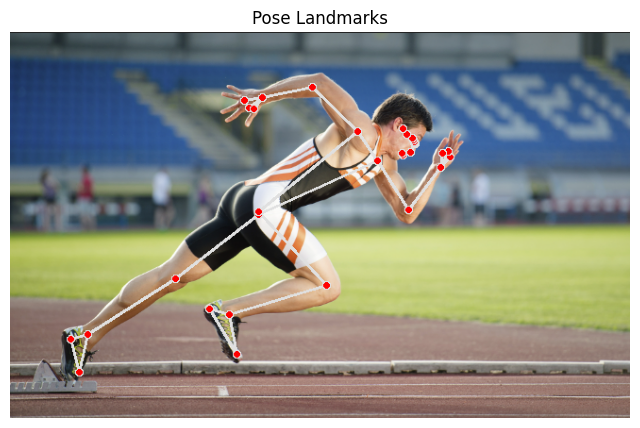


Normalized Landmarks for: Toe Off2.png
NOSE: x=0.6456, y=0.3117, z=-0.1041, vis=1.0000
LEFT_EYE_INNER: x=0.6531, y=0.2887, z=-0.0789, vis=1.0000
LEFT_EYE: x=0.6528, y=0.2877, z=-0.0789, vis=1.0000
LEFT_EYE_OUTER: x=0.6525, y=0.2865, z=-0.0788, vis=1.0000
RIGHT_EYE_INNER: x=0.6517, y=0.2845, z=-0.1187, vis=1.0000
RIGHT_EYE: x=0.6504, y=0.2804, z=-0.1187, vis=1.0000
RIGHT_EYE_OUTER: x=0.6488, y=0.2760, z=-0.1187, vis=1.0000
LEFT_EAR: x=0.6406, y=0.2652, z=0.0496, vis=1.0000
RIGHT_EAR: x=0.6346, y=0.2515, z=-0.1380, vis=1.0000
MOUTH_LEFT: x=0.6344, y=0.3201, z=-0.0547, vis=1.0000
MOUTH_RIGHT: x=0.6324, y=0.3151, z=-0.1090, vis=1.0000
LEFT_SHOULDER: x=0.5934, y=0.3331, z=0.1822, vis=1.0000
RIGHT_SHOULDER: x=0.5613, y=0.2590, z=-0.1907, vis=1.0000
LEFT_ELBOW: x=0.6427, y=0.4603, z=0.2620, vis=0.9923
RIGHT_ELBOW: x=0.4873, y=0.1443, z=-0.3807, vis=0.9984
LEFT_WRIST: x=0.6941, y=0.3518, z=0.2624, vis=0.9965
RIGHT_WRIST: x=0.4071, y=0.1708, z=-0.5237, vis=0.9954
LEFT_PINKY: x=0.7096, y=0.3242

In [23]:
# Call for a single image
analyze_pose(r"Toe Off2.png")

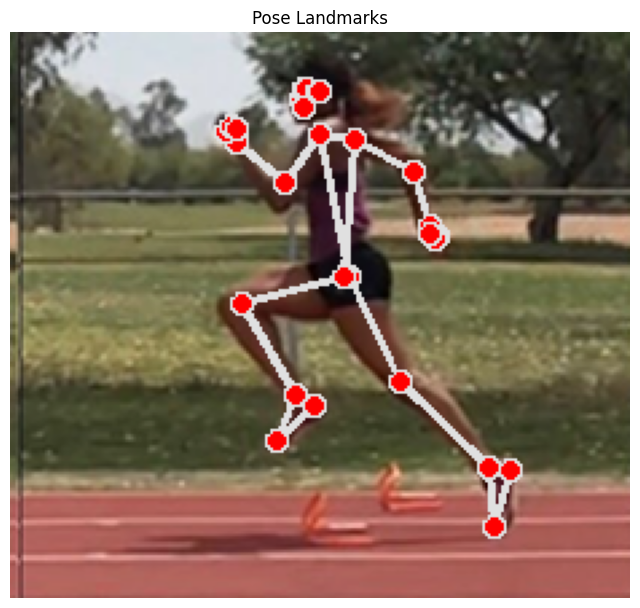


Normalized Landmarks for: toe_off original.png
NOSE: x=0.4687, y=0.1222, z=0.1766, vis=1.0000
LEFT_EYE_INNER: x=0.4752, y=0.1043, z=0.1274, vis=1.0000
LEFT_EYE: x=0.4767, y=0.1037, z=0.1274, vis=1.0000
LEFT_EYE_OUTER: x=0.4781, y=0.1031, z=0.1274, vis=1.0000
RIGHT_EYE_INNER: x=0.4759, y=0.1042, z=0.1791, vis=1.0000
RIGHT_EYE: x=0.4779, y=0.1036, z=0.1791, vis=1.0000
RIGHT_EYE_OUTER: x=0.4798, y=0.1030, z=0.1791, vis=1.0000
LEFT_EAR: x=0.4950, y=0.1048, z=-0.0138, vis=1.0000
RIGHT_EAR: x=0.4997, y=0.1069, z=0.2208, vis=0.9999
MOUTH_LEFT: x=0.4752, y=0.1345, z=0.1327, vis=0.9999
MOUTH_RIGHT: x=0.4753, y=0.1339, z=0.1996, vis=0.9998
LEFT_SHOULDER: x=0.5019, y=0.1810, z=-0.2192, vis=1.0000
RIGHT_SHOULDER: x=0.5569, y=0.1919, z=0.3446, vis=0.9994
LEFT_ELBOW: x=0.4417, y=0.2690, z=-0.2248, vis=0.9950
RIGHT_ELBOW: x=0.6509, y=0.2466, z=0.4385, vis=0.8588
LEFT_WRIST: x=0.3676, y=0.1988, z=0.0062, vis=0.9754
RIGHT_WRIST: x=0.6775, y=0.3443, z=0.4200, vis=0.7966
LEFT_PINKY: x=0.3498, y=0.1793, 

In [24]:
analyze_pose("toe_off original.png")

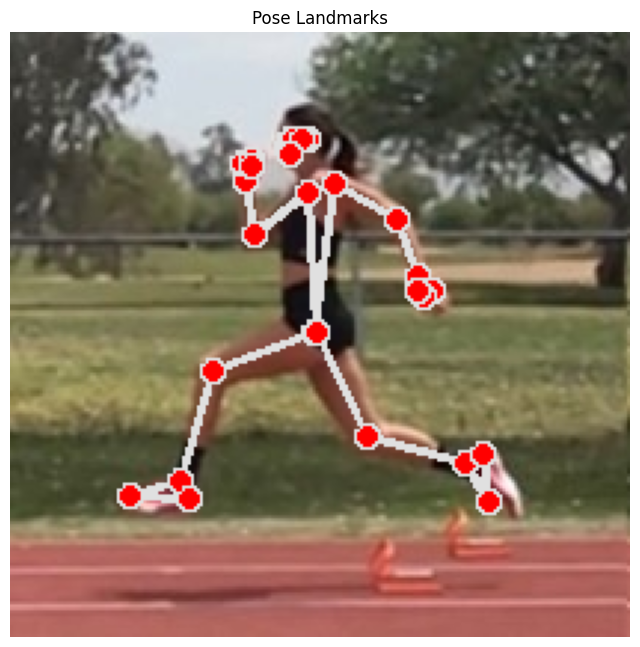


Normalized Landmarks for: MVP.JPG
NOSE: x=0.4460, y=0.1943, z=-0.1843, vis=0.9999
LEFT_EYE_INNER: x=0.4523, y=0.1794, z=-0.2126, vis=1.0000
LEFT_EYE: x=0.4542, y=0.1788, z=-0.2126, vis=1.0000
LEFT_EYE_OUTER: x=0.4562, y=0.1781, z=-0.2126, vis=1.0000
RIGHT_EYE_INNER: x=0.4521, y=0.1792, z=-0.1498, vis=0.9999
RIGHT_EYE: x=0.4536, y=0.1787, z=-0.1498, vis=0.9999
RIGHT_EYE_OUTER: x=0.4551, y=0.1781, z=-0.1497, vis=0.9999
LEFT_EAR: x=0.4795, y=0.1794, z=-0.2671, vis=1.0000
RIGHT_EAR: x=0.4737, y=0.1806, z=0.0095, vis=0.9999
MOUTH_LEFT: x=0.4528, y=0.2058, z=-0.2022, vis=0.9999
MOUTH_RIGHT: x=0.4527, y=0.2053, z=-0.1211, vis=0.9998
LEFT_SHOULDER: x=0.5216, y=0.2502, z=-0.3622, vis=1.0000
RIGHT_SHOULDER: x=0.4816, y=0.2661, z=0.2639, vis=0.9994
LEFT_ELBOW: x=0.6246, y=0.3091, z=-0.5812, vis=0.9999
RIGHT_ELBOW: x=0.3940, y=0.3369, z=0.4857, vis=0.8768
LEFT_WRIST: x=0.6601, y=0.4042, z=-0.7255, vis=0.9997
RIGHT_WRIST: x=0.3815, y=0.2464, z=0.5872, vis=0.9668
LEFT_PINKY: x=0.6810, y=0.4311, z=-

In [25]:
analyze_pose("MVP.JPG")

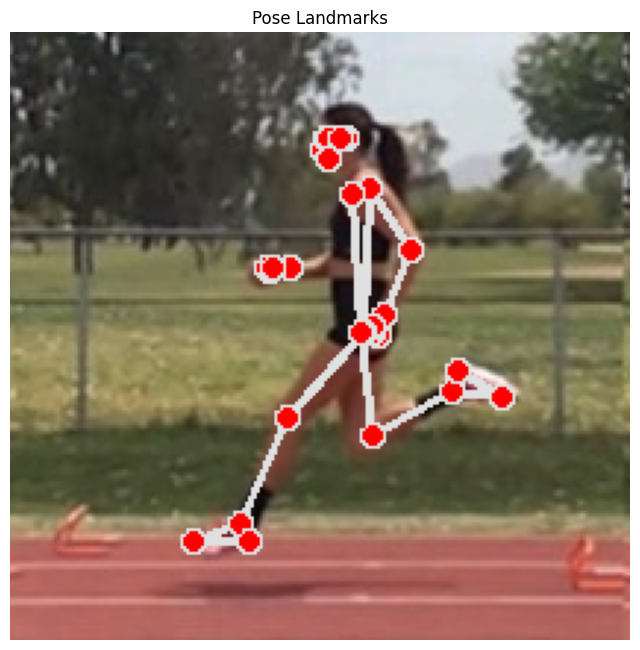


Normalized Landmarks for: Strike.JPG
NOSE: x=0.5048, y=0.1942, z=0.0008, vis=1.0000
LEFT_EYE_INNER: x=0.5117, y=0.1766, z=-0.0271, vis=1.0000
LEFT_EYE: x=0.5143, y=0.1761, z=-0.0271, vis=1.0000
LEFT_EYE_OUTER: x=0.5173, y=0.1753, z=-0.0272, vis=1.0000
RIGHT_EYE_INNER: x=0.5107, y=0.1762, z=0.0311, vis=1.0000
RIGHT_EYE: x=0.5124, y=0.1755, z=0.0310, vis=1.0000
RIGHT_EYE_OUTER: x=0.5141, y=0.1745, z=0.0310, vis=1.0000
LEFT_EAR: x=0.5406, y=0.1766, z=-0.1038, vis=1.0000
RIGHT_EAR: x=0.5347, y=0.1758, z=0.1486, vis=1.0000
MOUTH_LEFT: x=0.5146, y=0.2099, z=-0.0239, vis=1.0000
MOUTH_RIGHT: x=0.5128, y=0.2096, z=0.0498, vis=1.0000
LEFT_SHOULDER: x=0.5812, y=0.2589, z=-0.2607, vis=1.0000
RIGHT_SHOULDER: x=0.5536, y=0.2677, z=0.3556, vis=0.9995
LEFT_ELBOW: x=0.6471, y=0.3606, z=-0.3730, vis=0.9996
RIGHT_ELBOW: x=0.5370, y=0.3792, z=0.5174, vis=0.4735
LEFT_WRIST: x=0.6050, y=0.4663, z=-0.4041, vis=0.9994
RIGHT_WRIST: x=0.4503, y=0.3877, z=0.5077, vis=0.7406
LEFT_PINKY: x=0.5969, y=0.4981, z=-0.

In [26]:
analyze_pose("Strike.JPG")

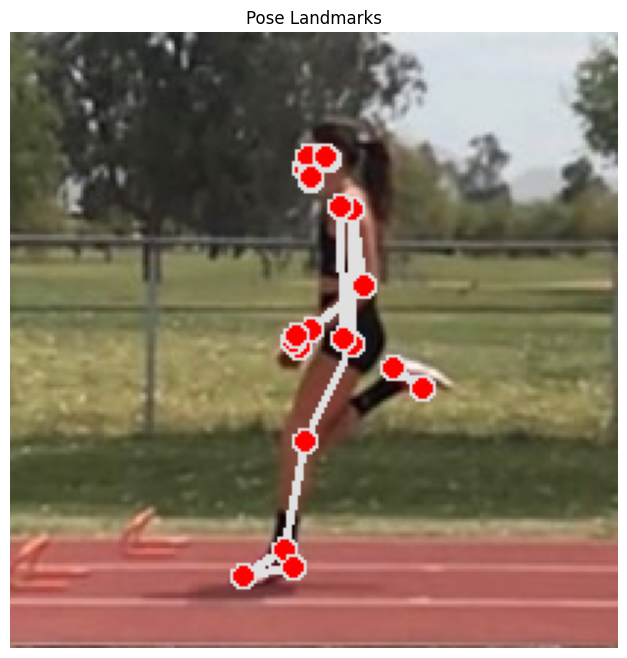


Normalized Landmarks for: Touch-Down.JPG
NOSE: x=0.4842, y=0.2224, z=-0.1984, vis=0.9995
LEFT_EYE_INNER: x=0.4902, y=0.2054, z=-0.2334, vis=0.9996
LEFT_EYE: x=0.4927, y=0.2047, z=-0.2334, vis=0.9997
LEFT_EYE_OUTER: x=0.4957, y=0.2038, z=-0.2334, vis=0.9998
RIGHT_EYE_INNER: x=0.4891, y=0.2049, z=-0.1691, vis=0.9993
RIGHT_EYE: x=0.4906, y=0.2040, z=-0.1692, vis=0.9992
RIGHT_EYE_OUTER: x=0.4924, y=0.2028, z=-0.1692, vis=0.9995
LEFT_EAR: x=0.5245, y=0.2054, z=-0.3194, vis=0.9997
RIGHT_EAR: x=0.5179, y=0.2044, z=-0.0352, vis=0.9986
MOUTH_LEFT: x=0.4970, y=0.2384, z=-0.2250, vis=0.9998
MOUTH_RIGHT: x=0.4948, y=0.2376, z=-0.1424, vis=0.9992
LEFT_SHOULDER: x=0.5651, y=0.2898, z=-0.4493, vis=1.0000
RIGHT_SHOULDER: x=0.5446, y=0.2836, z=0.1554, vis=0.9983
LEFT_ELBOW: x=0.5811, y=0.4121, z=-0.5184, vis=0.9961
RIGHT_ELBOW: x=0.5570, y=0.4076, z=0.2033, vis=0.0660
LEFT_WRIST: x=0.4952, y=0.4840, z=-0.4458, vis=0.9719
RIGHT_WRIST: x=0.5072, y=0.4827, z=0.0430, vis=0.0536
LEFT_PINKY: x=0.4764, y=0.5

In [27]:
analyze_pose("Touch-Down.JPG")

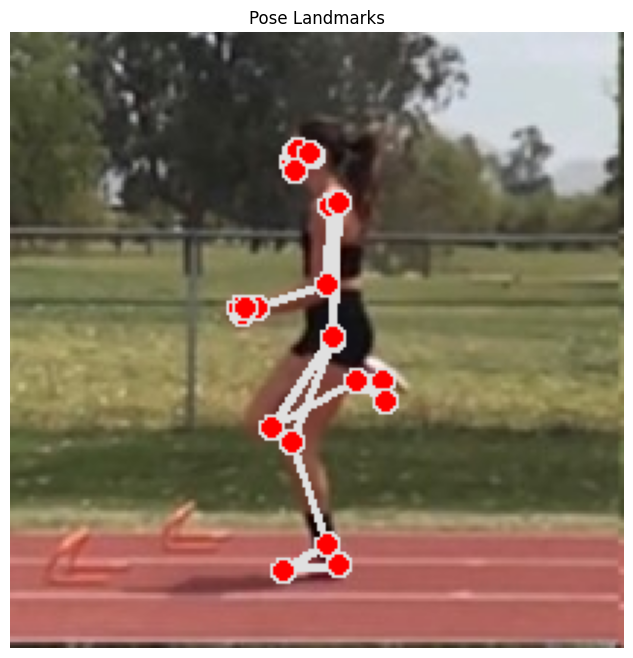


Normalized Landmarks for: Full Support.JPG
NOSE: x=0.4574, y=0.2123, z=-0.0994, vis=0.9999
LEFT_EYE_INNER: x=0.4638, y=0.1969, z=-0.1378, vis=0.9999
LEFT_EYE: x=0.4660, y=0.1965, z=-0.1378, vis=0.9999
LEFT_EYE_OUTER: x=0.4683, y=0.1960, z=-0.1379, vis=1.0000
RIGHT_EYE_INNER: x=0.4639, y=0.1961, z=-0.0733, vis=0.9999
RIGHT_EYE: x=0.4661, y=0.1952, z=-0.0733, vis=0.9999
RIGHT_EYE_OUTER: x=0.4684, y=0.1942, z=-0.0733, vis=0.9999
LEFT_EAR: x=0.4910, y=0.1996, z=-0.2349, vis=0.9999
RIGHT_EAR: x=0.4896, y=0.1975, z=0.0528, vis=0.9999
MOUTH_LEFT: x=0.4653, y=0.2258, z=-0.1289, vis=0.9999
MOUTH_RIGHT: x=0.4645, y=0.2245, z=-0.0456, vis=0.9997
LEFT_SHOULDER: x=0.5197, y=0.2830, z=-0.3902, vis=1.0000
RIGHT_SHOULDER: x=0.5368, y=0.2772, z=0.2341, vis=0.9995
LEFT_ELBOW: x=0.5166, y=0.4094, z=-0.4620, vis=0.9962
RIGHT_ELBOW: x=0.5362, y=0.4033, z=0.2689, vis=0.1611
LEFT_WRIST: x=0.4035, y=0.4464, z=-0.4179, vis=0.9844
RIGHT_WRIST: x=0.5394, y=0.5119, z=0.1016, vis=0.1591
LEFT_PINKY: x=0.3772, y=0.

In [28]:
analyze_pose("Full Support.JPG")

In [29]:
def classify_pose(angles, min_hits=4):
    """
    Return (label, confidence%).
    min_hits = required number of rule clauses to accept a pose (otherwise 'Unknown').
    """
    rk, lk = angles["Right Knee"],  angles["Left Knee"]
    rh, lh = angles["Right Hip"],   angles["Left Hip"]
    re, le = angles["Right Elbow"], angles["Left Elbow"]
    rs, ls = angles["Right Shoulder"], angles["Left Shoulder"]
    ra, la = angles["Right Ankle (Heel-to-Toe)"], angles["Left Ankle (Heel-to-Toe)"]

    pose_scores = {k: 0 for k in ["Toe Off","MVP","Strike","Touch Down","Full Support"]}

    # Initial ankle ranges; tune on your data as needed.
    rules = {
        "Toe Off": [
            75 < rk < 85,    160 < lk < 175,  95 < rh < 115,  160 < lh < 175,
            95 < re < 140,   80 < le < 95,   55< rs < 75,  40 < ls < 65,
            95 < ra < 135,   130 < la < 145
        ],
        "MVP": [
            120 < rk < 140,  115 < lk < 127, 150 < rh < 175,  120 < lh < 145,
            47 < re < 67,    130 < le < 150, 55 < rs < 70,    65 < ls < 85,
            120 < ra < 140,  125 < la < 150
        ],
        "Strike": [
            55 < rk < 75,    150 < lk < 165, 170 < rh < 180,  130 < lh < 140,
            100 < re < 115,  115 < le < 130, 10 < rs < 25,    30 < ls < 45,
            140 < ra < 170,   90 < la < 110
        ],
        "Touch Down": [
            45 < rk < 60,    155 < lk < 170, 150 < rh < 170,  145 < lh < 160,
            130 < re < 150,  105 < le < 120, 0 < rs < 10,     10 < ls < 20,
            130 < ra < 160,   85 < la < 105
        ],
        "Full Support": [
            15 < rk < 30,    135 < lk < 160, 130 < rh < 145,  150 < lh < 165,
            155 < re < 175,  100 < le < 130, 0 < rs < 10,     5 < ls < 15,
            95 < ra < 115,   120 < la < 150
        ],
    }

    for pose_name, conditions in rules.items():
        pose_scores[pose_name] = int(np.sum(conditions))

    # best category
    best_pose = max(pose_scores, key=pose_scores.get)
    best_score = pose_scores[best_pose]
    max_possible = len(rules[best_pose])

    if best_score < min_hits:
        return "Unknown Pose", 0.0

    confidence = round((best_score / max_possible) * 100.0, 1)
    return best_pose, confidence

# ------------------------------------------------------------------------------
# Single-image classify (quick check)
# ------------------------------------------------------------------------------
def analyze_and_classify_pose(image_path, min_hits=4):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image not found at: {image_path}")
        return

    results = pose.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    if not results.pose_landmarks:
        print("No pose detected.")
        return

    angles = compute_joint_angles(results.pose_landmarks.landmark)
    label, confidence = classify_pose(angles, min_hits=min_hits)
    print(f"\n⏱ Detected Pose: {label} ({confidence}%)")

    image_out = image.copy()
    mp_drawing.draw_landmarks(image_out, results.pose_landmarks, mp_pose.POSE_CONNECTIONS)
    cv2.putText(image_out, f"{label} ({confidence}%)", (5, 11),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                (255, 0, 0) if label != 'Unknown Pose' else (0, 0, 255), 3)

    plt.figure(figsize=(8, 8)); plt.title(f"Classified Pose: {label}"); plt.axis('off')
    plt.imshow(cv2.cvtColor(image_out, cv2.COLOR_BGR2RGB)); plt.show()



⏱ Detected Pose: Toe Off (100.0%)


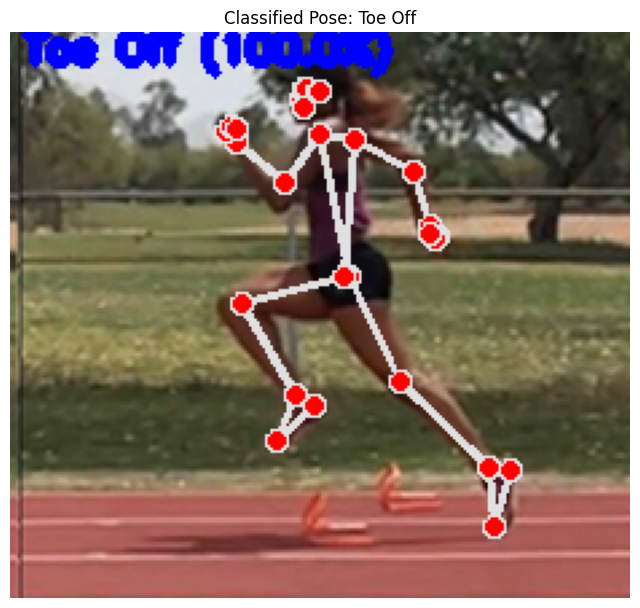

In [33]:
analyze_and_classify_pose("toe_off original.png")

In [34]:
from collections import defaultdict
import os, glob, csv
from pathlib import Path

POSE_LIST = ["Toe Off", "MVP", "Strike", "Touch Down", "Full Support"]

def _annotate_and_save(image, results, label, confidence, out_path):
    img = image.copy()
    if results.pose_landmarks:
        mp_drawing.draw_landmarks(img, results.pose_landmarks, mp_pose.POSE_CONNECTIONS)
    cv2.putText(img, f"{label} ({confidence}%)", (10, 40),
                cv2.FONT_HERSHEY_SIMPLEX, 1.2,
                (0, 255, 0) if label != 'Unknown Pose' else (0, 0, 255), 3)
    cv2.imwrite(out_path, img)

def analyze_folder_topk(folder_path,
                        top_k=4,                # <-- best 4 images per pose
                        min_hits=4,
                        save_best=True,
                        out_dir=None,
                        angles_csv_path=None,   # <-- NEW: where to save angles CSV
                        dedupe_across_poses=False):
    """
    Scans a folder of frames, classifies each frame, and picks the top_k frames per pose.
    Saves annotated copies to `out_dir` and (optionally) writes a CSV with angles.

    Returns: dict {pose_name: [ {"path": str, "confidence": float, "angles": dict}, ... ]}
    """
    # output folders/files
    if out_dir is None:
        out_dir = os.path.join(folder_path, "best_pose_frames_topk")
    os.makedirs(out_dir, exist_ok=True)
    if angles_csv_path is None:
        angles_csv_path = os.path.join(out_dir, "selected_pose_angles.csv")

    # gather images
    patterns = ['*.png','*.jpg','*.jpeg','*.bmp','*.JPG','*.PNG','*.JPEG']
    frame_paths = []
    for p in patterns:
        frame_paths.extend(glob.glob(os.path.join(folder_path, p)))
    frame_paths = sorted(frame_paths)

    # classify all frames and keep angles
    per_pose = defaultdict(list)
    for fp in frame_paths:
        img = cv2.imread(fp)
        if img is None:
            continue

        res = pose.process(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        if not res.pose_landmarks:
            continue

        angles = compute_joint_angles(res.pose_landmarks.landmark)
        label, conf = classify_pose(angles, min_hits=min_hits)

        if label in POSE_LIST:
            per_pose[label].append({
                "path": fp,
                "confidence": float(conf),
                "angles": angles
            })

    # choose top_k per pose
    selected = {}
    used_paths = set()
    for pose_name in POSE_LIST:
        candidates = sorted(per_pose.get(pose_name, []),
                            key=lambda d: d["confidence"], reverse=True)

        if dedupe_across_poses:
            top = []
            for d in candidates:
                if d["path"] not in used_paths:
                    top.append(d)
                    used_paths.add(d["path"])
                if len(top) == top_k:
                    break
        else:
            top = candidates[:top_k]

        selected[pose_name] = top

        # save annotated copies
        if save_best and top:
            subdir = os.path.join(out_dir, pose_name.replace(" ", "_"))
            os.makedirs(subdir, exist_ok=True)
            for rank, item in enumerate(top, 1):
                img = cv2.imread(item["path"])
                res = pose.process(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
                base = os.path.basename(item["path"])
                out_path = os.path.join(
                    subdir,
                    f"{rank:02d}__{pose_name}__{item['confidence']:.1f}__{base}"
                )
                _annotate_and_save(img, res, pose_name, item["confidence"], out_path)

    # console summary
    print("\n=== Top picks per pose ===")
    for pose_name in POSE_LIST:
        top = selected.get(pose_name, [])
        if not top:
            print(f"{pose_name}: (none)")
        else:
            for i, it in enumerate(top, 1):
                print(f"{pose_name} [{i}]: {it['path']} ({it['confidence']}%)")

    # ---- write ANGLES CSV (up to 20 rows) ----
    headers = [
        "Pose", "Rank", "Confidence(%)", "Filename", "Path",
        "Right Knee", "Left Knee",
        "Right Hip", "Left Hip",
        "Right Elbow", "Left Elbow",
        "Right Shoulder", "Left Shoulder",
        "Right Ankle (Heel-to-Toe)", "Left Ankle (Heel-to-Toe)"
    ]
    with open(angles_csv_path, "w", newline="", encoding="utf-8") as f:
        w = csv.writer(f)
        w.writerow(headers)
        for pose_name in POSE_LIST:
            for rank, item in enumerate(selected.get(pose_name, []), 1):
                ang = item["angles"]
                row = [
                    pose_name,
                    rank,
                    f"{item['confidence']:.1f}",
                    os.path.basename(item["path"]),
                    item["path"],
                    f"{ang['Right Knee']:.2f}°",
                    f"{ang['Left Knee']:.2f}°",
                    f"{ang['Right Hip']:.2f}°",
                    f"{ang['Left Hip']:.2f}°",
                    f"{ang['Right Elbow']:.2f}°",
                    f"{ang['Left Elbow']:.2f}°",
                    f"{ang['Right Shoulder']:.2f}°",
                    f"{ang['Left Shoulder']:.2f}°",
                    f"{ang['Right Ankle (Heel-to-Toe)']:.2f}°",
                    f"{ang['Left Ankle (Heel-to-Toe)']:.2f}°",
                ]
                w.writerow(row)

    print(f"\n✅ Angles CSV written to: {angles_csv_path}")
    return selected

# ------------------------------------------------------------------------------
# ENTRY POINT — set INPUT folder, OUTPUT folder, and CSV path
# ------------------------------------------------------------------------------
if __name__ == "__main__":
    from pathlib import Path

    # 🔹 CHANGE THESE PATHS
    FRAMES_DIR = Path(r"C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2")
    OUT_DIR    = Path(r"E:\yoga new\final poses")
    ANGLES_CSV = OUT_DIR / "final_poses_angles.csv"

    best4 = analyze_folder_topk(
        folder_path=str(FRAMES_DIR),
        top_k=4,                     # exactly 4 per pose
        min_hits=4,
        save_best=True,
        out_dir=str(OUT_DIR),
        angles_csv_path=str(ANGLES_CSV),
        dedupe_across_poses=False
    )



=== Top picks per pose ===
Toe Off [1]: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000066.png (90.0%)
Toe Off [2]: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000066.png (90.0%)
Toe Off [3]: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000010.png (70.0%)
Toe Off [4]: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000010.png (70.0%)
MVP [1]: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000026.png (70.0%)
MVP [2]: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000026.png (70.0%)
MVP [3]: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\expo


[1] Pose: Toe Off  |  Rank: 1  |  Confidence: 90.0%
     File: crop_000066.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000066.png
     Angles:
       - Right Knee: 78.05°
       - Left Knee: 166.84°
       - Right Hip: 112.16°
       - Left Hip: 161.66°
       - Right Elbow: 139.21°
       - Left Elbow: 35.07°
       - Right Shoulder: 70.68°
       - Left Shoulder: 62.95°
       - Right Ankle (Heel-to-Toe): 122.66°
       - Left Ankle (Heel-to-Toe): 136.80°


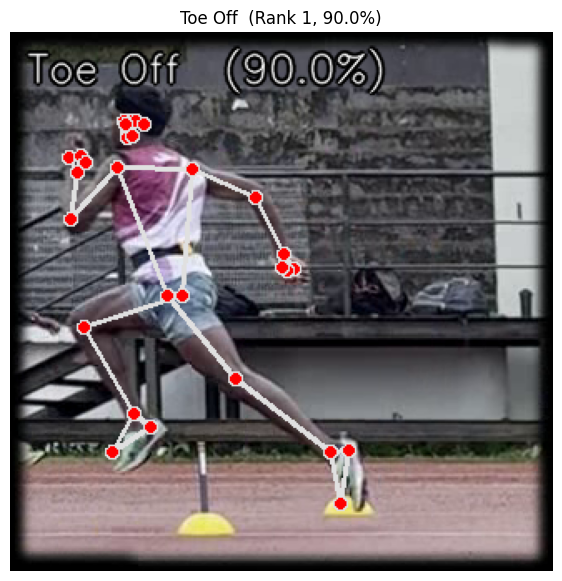


[2] Pose: Toe Off  |  Rank: 2  |  Confidence: 90.0%
     File: crop_000066.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000066.png
     Angles:
       - Right Knee: 78.05°
       - Left Knee: 166.84°
       - Right Hip: 112.16°
       - Left Hip: 161.66°
       - Right Elbow: 139.21°
       - Left Elbow: 35.07°
       - Right Shoulder: 70.68°
       - Left Shoulder: 62.95°
       - Right Ankle (Heel-to-Toe): 122.66°
       - Left Ankle (Heel-to-Toe): 136.80°


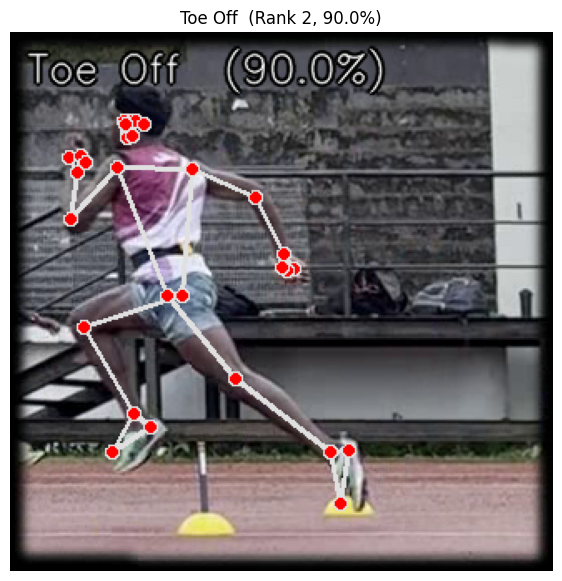


[3] Pose: Toe Off  |  Rank: 3  |  Confidence: 70.0%
     File: crop_000010.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000010.png
     Angles:
       - Right Knee: 83.47°
       - Left Knee: 165.50°
       - Right Hip: 112.61°
       - Left Hip: 160.38°
       - Right Elbow: 156.87°
       - Left Elbow: 76.13°
       - Right Shoulder: 60.77°
       - Left Shoulder: 55.85°
       - Right Ankle (Heel-to-Toe): 111.75°
       - Left Ankle (Heel-to-Toe): 129.53°


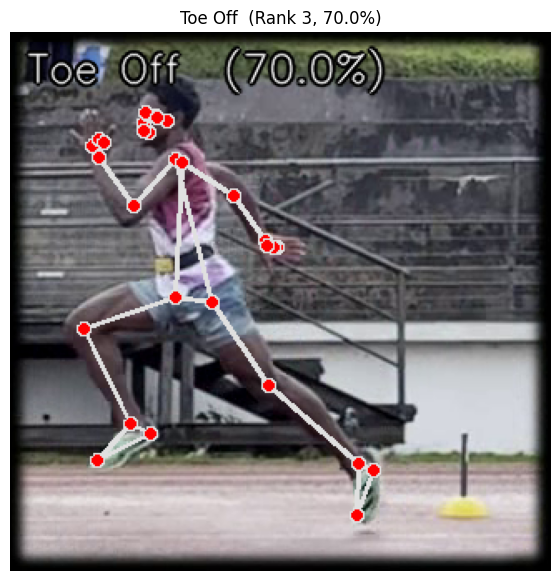


[4] Pose: Toe Off  |  Rank: 4  |  Confidence: 70.0%
     File: crop_000010.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000010.png
     Angles:
       - Right Knee: 83.47°
       - Left Knee: 165.50°
       - Right Hip: 112.61°
       - Left Hip: 160.38°
       - Right Elbow: 156.87°
       - Left Elbow: 76.13°
       - Right Shoulder: 60.77°
       - Left Shoulder: 55.85°
       - Right Ankle (Heel-to-Toe): 111.75°
       - Left Ankle (Heel-to-Toe): 129.53°


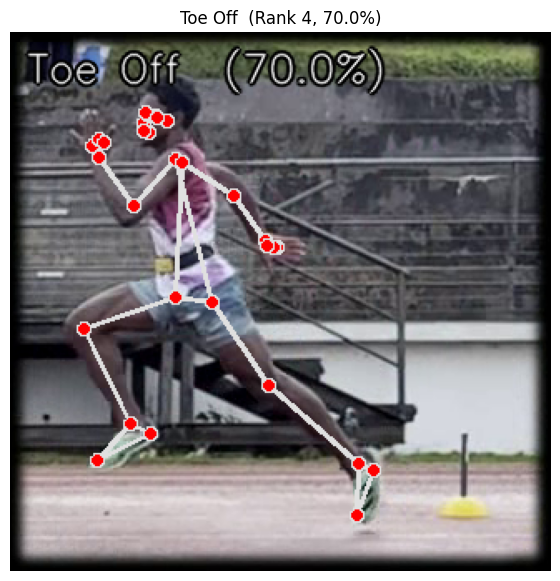


[5] Pose: MVP  |  Rank: 1  |  Confidence: 70.0%
     File: crop_000026.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000026.png
     Angles:
       - Right Knee: 132.11°
       - Left Knee: 123.47°
       - Right Hip: 169.09°
       - Left Hip: 113.78°
       - Right Elbow: 53.59°
       - Left Elbow: 123.92°
       - Right Shoulder: 57.64°
       - Left Shoulder: 82.52°
       - Right Ankle (Heel-to-Toe): 120.57°
       - Left Ankle (Heel-to-Toe): 113.77°


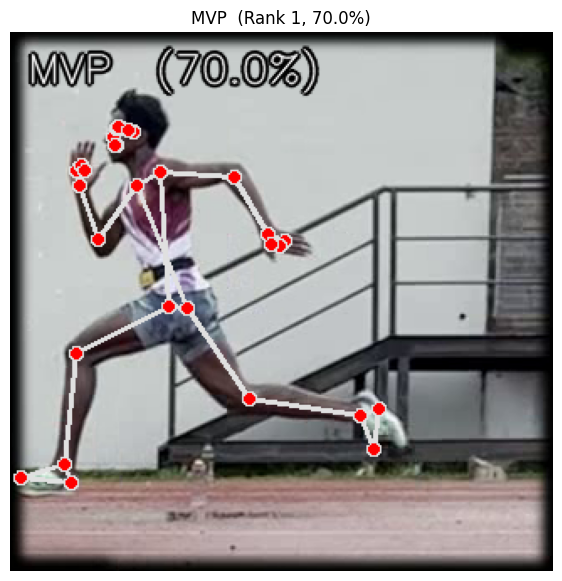


[6] Pose: MVP  |  Rank: 2  |  Confidence: 70.0%
     File: crop_000026.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000026.png
     Angles:
       - Right Knee: 132.11°
       - Left Knee: 123.47°
       - Right Hip: 169.09°
       - Left Hip: 113.78°
       - Right Elbow: 53.59°
       - Left Elbow: 123.92°
       - Right Shoulder: 57.64°
       - Left Shoulder: 82.52°
       - Right Ankle (Heel-to-Toe): 120.57°
       - Left Ankle (Heel-to-Toe): 113.77°


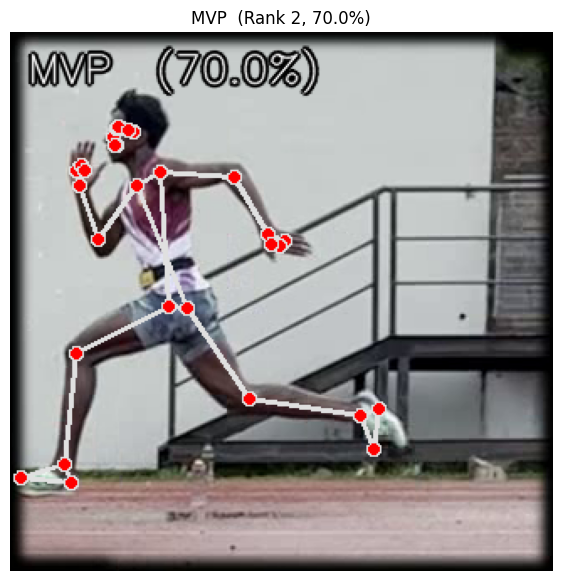


[7] Pose: MVP  |  Rank: 3  |  Confidence: 50.0%
     File: crop_000054.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000054.png
     Angles:
       - Right Knee: 134.83°
       - Left Knee: 114.76°
       - Right Hip: 171.21°
       - Left Hip: 102.77°
       - Right Elbow: 51.24°
       - Left Elbow: 121.37°
       - Right Shoulder: 39.70°
       - Left Shoulder: 70.34°
       - Right Ankle (Heel-to-Toe): 134.12°
       - Left Ankle (Heel-to-Toe): 112.67°


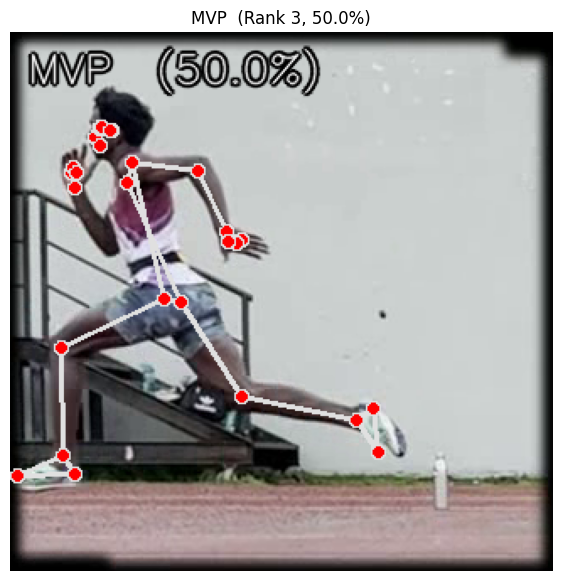


[8] Pose: MVP  |  Rank: 4  |  Confidence: 50.0%
     File: crop_000054.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000054.png
     Angles:
       - Right Knee: 134.83°
       - Left Knee: 114.76°
       - Right Hip: 171.21°
       - Left Hip: 102.77°
       - Right Elbow: 51.24°
       - Left Elbow: 121.37°
       - Right Shoulder: 39.70°
       - Left Shoulder: 70.34°
       - Right Ankle (Heel-to-Toe): 134.12°
       - Left Ankle (Heel-to-Toe): 112.67°


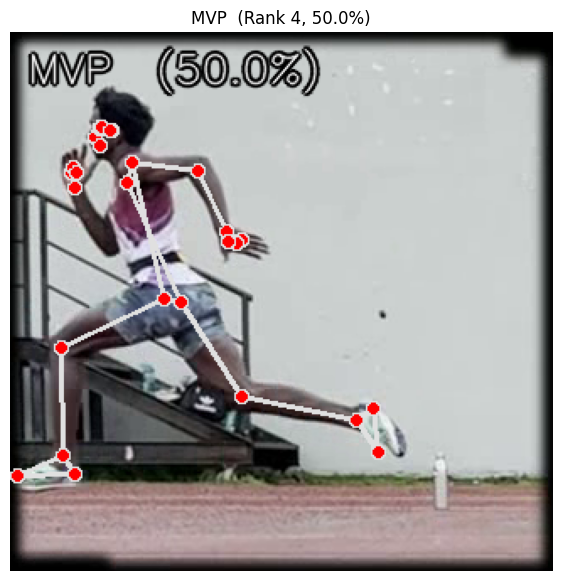


[9] Pose: Strike  |  Rank: 1  |  Confidence: 60.0%
     File: crop_000002.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000002.png
     Angles:
       - Right Knee: 69.36°
       - Left Knee: 153.39°
       - Right Hip: 176.92°
       - Left Hip: 133.93°
       - Right Elbow: 124.83°
       - Left Elbow: 97.59°
       - Right Shoulder: 22.58°
       - Left Shoulder: 65.81°
       - Right Ankle (Heel-to-Toe): 150.74°
       - Left Ankle (Heel-to-Toe): 136.12°


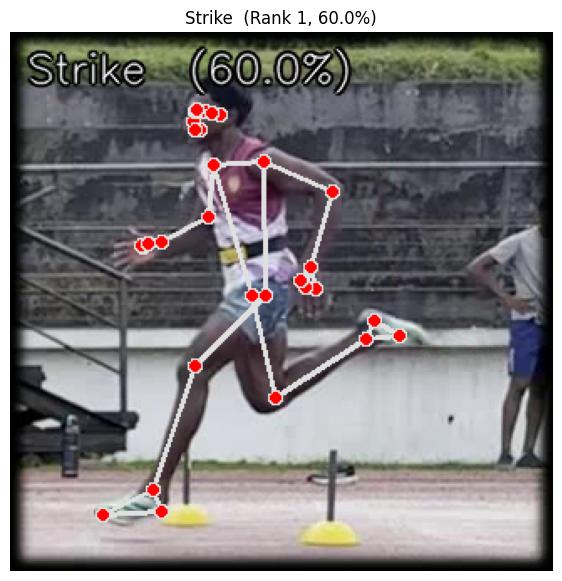


[10] Pose: Strike  |  Rank: 2  |  Confidence: 60.0%
     File: crop_000002.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000002.png
     Angles:
       - Right Knee: 69.36°
       - Left Knee: 153.39°
       - Right Hip: 176.92°
       - Left Hip: 133.93°
       - Right Elbow: 124.83°
       - Left Elbow: 97.59°
       - Right Shoulder: 22.58°
       - Left Shoulder: 65.81°
       - Right Ankle (Heel-to-Toe): 150.74°
       - Left Ankle (Heel-to-Toe): 136.12°


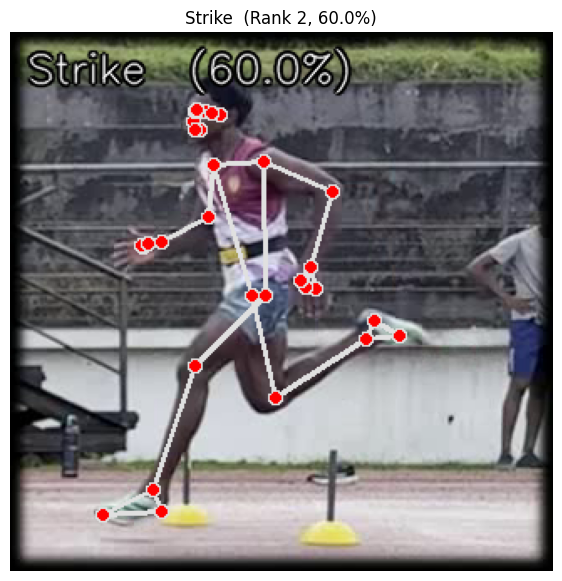


[11] Pose: Strike  |  Rank: 3  |  Confidence: 60.0%
     File: crop_000030.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000030.png
     Angles:
       - Right Knee: 67.08°
       - Left Knee: 158.77°
       - Right Hip: 173.03°
       - Left Hip: 134.82°
       - Right Elbow: 105.27°
       - Left Elbow: 109.72°
       - Right Shoulder: 1.15°
       - Left Shoulder: 44.78°
       - Right Ankle (Heel-to-Toe): 139.11°
       - Left Ankle (Heel-to-Toe): 139.60°


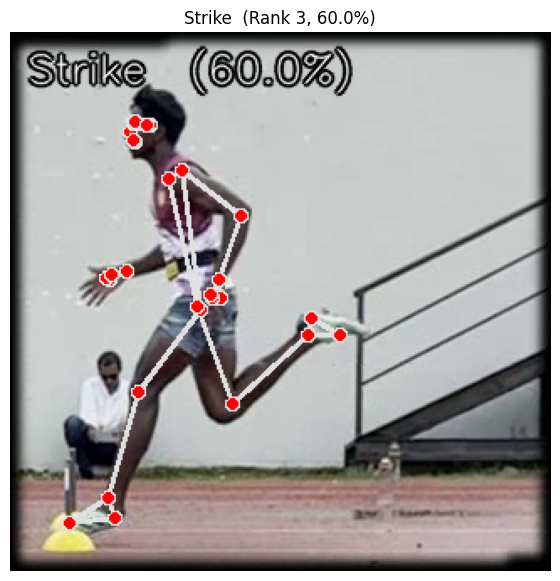


[12] Pose: Strike  |  Rank: 4  |  Confidence: 60.0%
     File: crop_000030.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000030.png
     Angles:
       - Right Knee: 67.08°
       - Left Knee: 158.77°
       - Right Hip: 173.03°
       - Left Hip: 134.82°
       - Right Elbow: 105.27°
       - Left Elbow: 109.72°
       - Right Shoulder: 1.15°
       - Left Shoulder: 44.78°
       - Right Ankle (Heel-to-Toe): 139.11°
       - Left Ankle (Heel-to-Toe): 139.60°


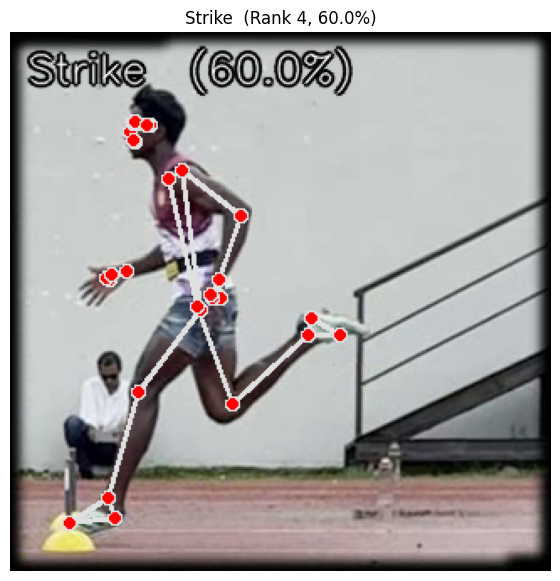


[13] Pose: Touch Down  |  Rank: 1  |  Confidence: 60.0%
     File: crop_000032.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000032.png
     Angles:
       - Right Knee: 36.89°
       - Left Knee: 151.08°
       - Right Hip: 144.21°
       - Left Hip: 149.37°
       - Right Elbow: 144.48°
       - Left Elbow: 110.02°
       - Right Shoulder: 6.69°
       - Left Shoulder: 12.82°
       - Right Ankle (Heel-to-Toe): 51.73°
       - Left Ankle (Heel-to-Toe): 100.74°


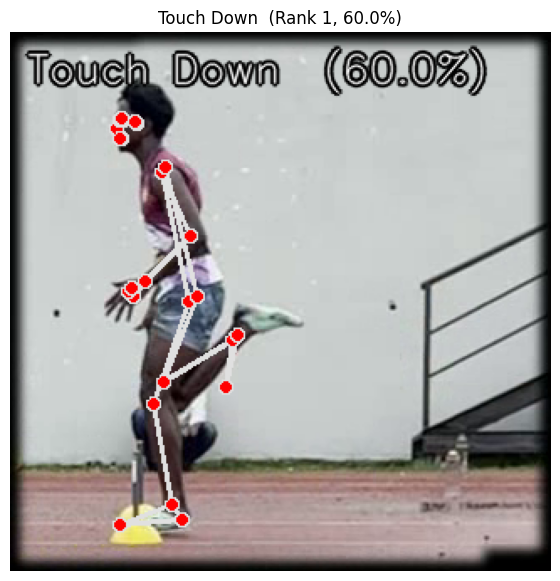


[14] Pose: Touch Down  |  Rank: 2  |  Confidence: 60.0%
     File: crop_000032.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000032.png
     Angles:
       - Right Knee: 36.89°
       - Left Knee: 151.08°
       - Right Hip: 144.21°
       - Left Hip: 149.37°
       - Right Elbow: 144.48°
       - Left Elbow: 110.02°
       - Right Shoulder: 6.69°
       - Left Shoulder: 12.82°
       - Right Ankle (Heel-to-Toe): 51.73°
       - Left Ankle (Heel-to-Toe): 100.74°


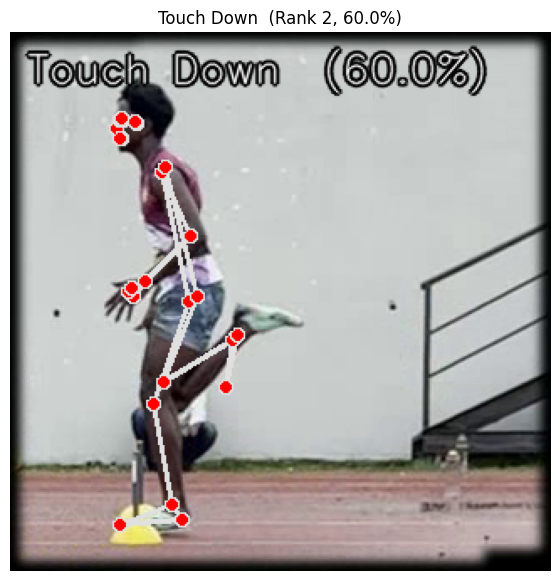


[15] Pose: Touch Down  |  Rank: 3  |  Confidence: 50.0%
     File: crop_000073.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000073.png
     Angles:
       - Right Knee: 157.97°
       - Left Knee: 161.91°
       - Right Hip: 165.65°
       - Left Hip: 161.38°
       - Right Elbow: 141.44°
       - Left Elbow: 153.84°
       - Right Shoulder: 2.14°
       - Left Shoulder: 8.52°
       - Right Ankle (Heel-to-Toe): 136.92°
       - Left Ankle (Heel-to-Toe): 148.03°


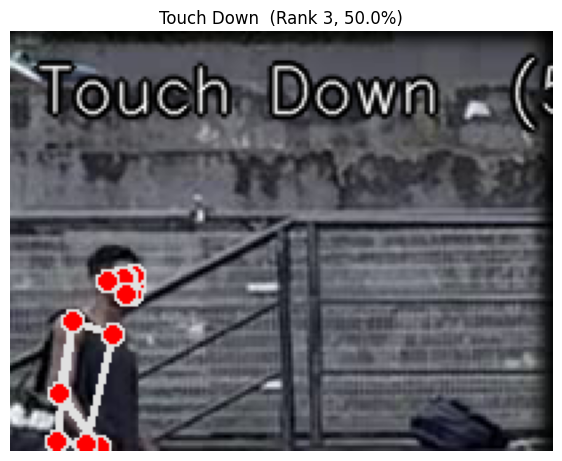


[16] Pose: Touch Down  |  Rank: 4  |  Confidence: 50.0%
     File: crop_000073.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000073.png
     Angles:
       - Right Knee: 157.97°
       - Left Knee: 161.91°
       - Right Hip: 165.65°
       - Left Hip: 161.38°
       - Right Elbow: 141.44°
       - Left Elbow: 153.84°
       - Right Shoulder: 2.14°
       - Left Shoulder: 8.52°
       - Right Ankle (Heel-to-Toe): 136.92°
       - Left Ankle (Heel-to-Toe): 148.03°


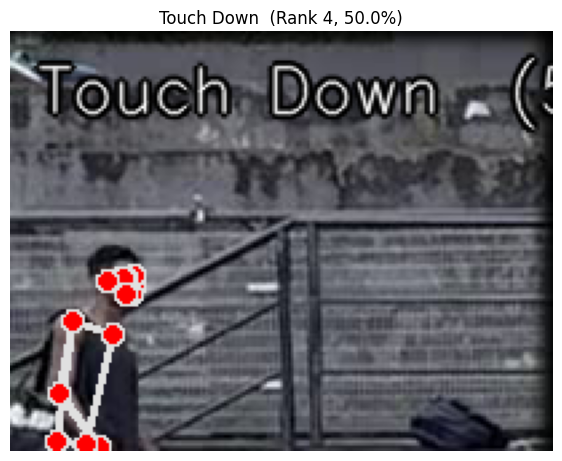


[17] Pose: Full Support  |  Rank: 1  |  Confidence: 60.0%
     File: crop_000005.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000005.png
     Angles:
       - Right Knee: 62.50°
       - Left Knee: 140.10°
       - Right Hip: 137.46°
       - Left Hip: 146.73°
       - Right Elbow: 165.24°
       - Left Elbow: 100.43°
       - Right Shoulder: 16.43°
       - Left Shoulder: 9.11°
       - Right Ankle (Heel-to-Toe): 102.35°
       - Left Ankle (Heel-to-Toe): 102.58°


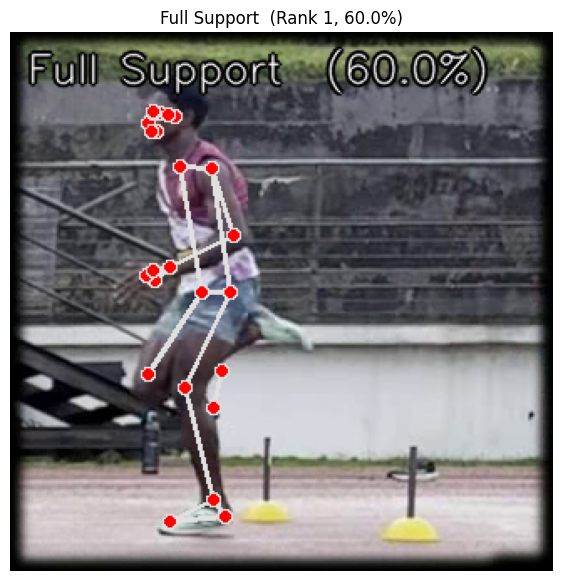


[18] Pose: Full Support  |  Rank: 2  |  Confidence: 60.0%
     File: crop_000005.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000005.png
     Angles:
       - Right Knee: 62.50°
       - Left Knee: 140.10°
       - Right Hip: 137.46°
       - Left Hip: 146.73°
       - Right Elbow: 165.24°
       - Left Elbow: 100.43°
       - Right Shoulder: 16.43°
       - Left Shoulder: 9.11°
       - Right Ankle (Heel-to-Toe): 102.35°
       - Left Ankle (Heel-to-Toe): 102.58°


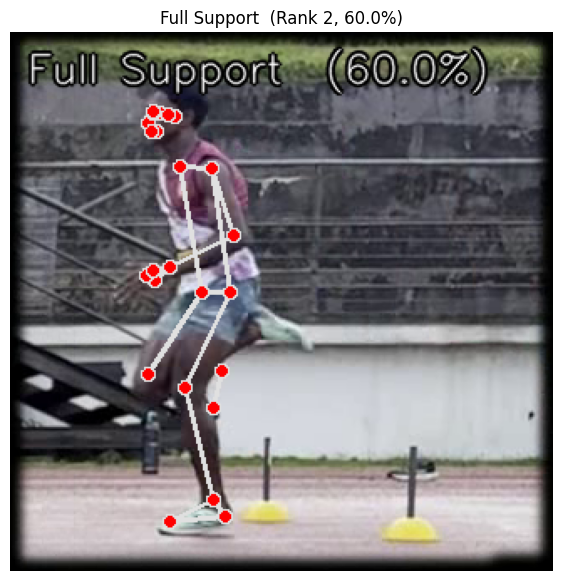


[19] Pose: Full Support  |  Rank: 3  |  Confidence: 60.0%
     File: crop_000006.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000006.png
     Angles:
       - Right Knee: 66.79°
       - Left Knee: 144.68°
       - Right Hip: 131.12°
       - Left Hip: 157.18°
       - Right Elbow: 167.14°
       - Left Elbow: 98.91°
       - Right Shoulder: 10.49°
       - Left Shoulder: 7.48°
       - Right Ankle (Heel-to-Toe): 106.90°
       - Left Ankle (Heel-to-Toe): 104.63°


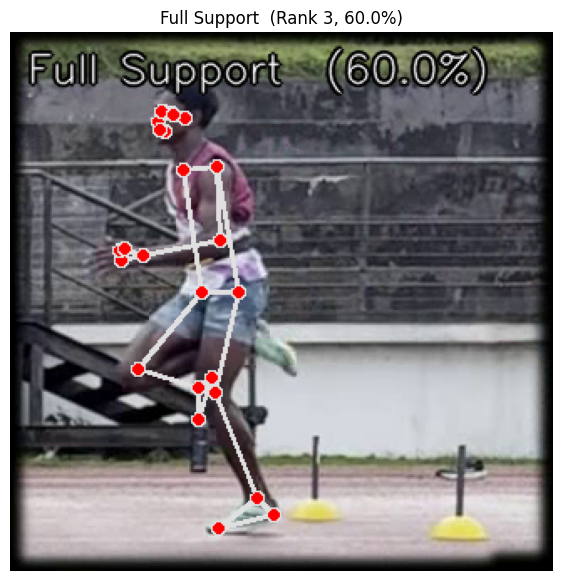


[20] Pose: Full Support  |  Rank: 4  |  Confidence: 60.0%
     File: crop_000006.png
     Path: C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\exported_frames_cropped2\crop_000006.png
     Angles:
       - Right Knee: 66.79°
       - Left Knee: 144.68°
       - Right Hip: 131.12°
       - Left Hip: 157.18°
       - Right Elbow: 167.14°
       - Left Elbow: 98.91°
       - Right Shoulder: 10.49°
       - Left Shoulder: 7.48°
       - Right Ankle (Heel-to-Toe): 106.90°
       - Left Ankle (Heel-to-Toe): 104.63°


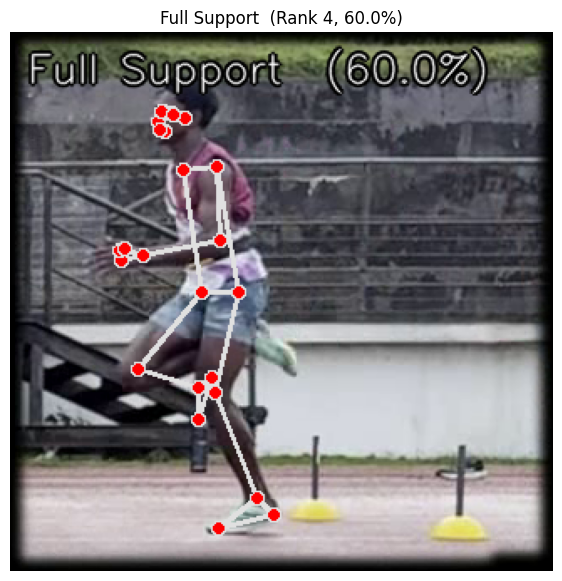

In [51]:
# === Read & Print CSV + Show Images with MediaPipe Sketch ======================
# Put this BELOW your previous code (after you've defined: pose, mp_pose, mp_drawing)
# ==============================================================================

import csv
import os
import cv2
import matplotlib.pyplot as plt

ANGLE_COLS = [
    "Right Knee", "Left Knee",
    "Right Hip", "Left Hip",
    "Right Elbow", "Left Elbow",
    "Right Shoulder", "Left Shoulder",
    "Right Ankle (Heel-to-Toe)", "Left Ankle (Heel-to-Toe)"
]

def _put_text_line(img, text, org, font_scale=0.6):
    """Draw readable text with a light outline."""
    x, y = org
    # outline (black)
    cv2.putText(img, text, (x, y), cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0,0,0), 3, cv2.LINE_AA)
    # main (white)
    cv2.putText(img, text, (x, y), cv2.FONT_HERSHEY_SIMPLEX, font_scale, (255,255,255), 1, cv2.LINE_AA)

def print_and_show_csv(angles_csv_path, draw_landmarks=True, show_images=True, max_rows=None):
    """
    Reads the selected_pose_angles.csv and for each row:
      - Prints: Pose, Confidence(%), Filename, Path, and all angles
      - (Optional) Shows the image with MediaPipe skeleton + overlay (pose & confidence)
    """
    if not os.path.exists(angles_csv_path):
        print(f"[ERROR] CSV not found: {angles_csv_path}")
        return

    with open(angles_csv_path, "r", encoding="utf-8") as f:
        reader = csv.DictReader(f)
        rows = list(reader)

    if max_rows is not None:
        rows = rows[:max_rows]

    for idx, row in enumerate(rows, 1):
        pose_name   = row.get("Pose", "")
        rank        = row.get("Rank", "")
        conf        = row.get("Confidence(%)", "")
        filename    = row.get("Filename", "")
        path        = row.get("Path", "")

        print(f"\n[{idx}] Pose: {pose_name}  |  Rank: {rank}  |  Confidence: {conf}%")
        print(f"     File: {filename}")
        print(f"     Path: {path}")
        print( "     Angles:")
        for col in ANGLE_COLS:
            val = row.get(col, "")
            print(f"       - {col}: {val}")

        if show_images:
            img = cv2.imread(path)
            if img is None:
                print("     [WARN] Could not open image, skipping display.")
                continue

            # Draw landmarks if requested
            if draw_landmarks:
                res = pose.process(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
                if res.pose_landmarks:
                    mp_drawing.draw_landmarks(img, res.pose_landmarks, mp_pose.POSE_CONNECTIONS)

            # Overlay small info (pose + confidence) at top-left
            _put_text_line(img, f"{pose_name}  ({conf}%)", (10, 30), font_scale=0.8)

            # Show with matplotlib
            plt.figure(figsize=(7, 7))
            plt.title(f"{pose_name}  (Rank {rank}, {conf}%)")
            plt.axis('off')
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.show()

# ------------------------------------------------------------------------------
# EXAMPLE CALL — set your CSV path and run
# ------------------------------------------------------------------------------
if __name__ == "__main__":
    # Use the same OUT_DIR you used for saving results earlier:
    OUT_DIR    = r"C:\Users\yenul\PycharmProjects\YOLO_speed_tracker\mediapipe detection and get scetch\best_pose_frames_top4"
    CSV_PATH   = os.path.join(OUT_DIR, r"C:\Users\yenul\OneDrive\Desktop\meeting\final poses\final_poses_angles.csv")

    # Print and show everything (20 rows max: 4 per each of the 5 poses)
    print_and_show_csv(CSV_PATH, draw_landmarks=True, show_images=True, max_rows=None)
